# **CycleGAN model to predict how a person will look after few years**

Dataset consists of different people photos (young and old). They are head shots, full body photo, multiple people in a photo, close up, selfies, etc.

In [ ]:
!pip install tensorflow-addons

     |████████████████████████████████| 1.1 MB 5.4 MB/s 


In [ ]:
import os
from zipfile import ZipFile as zp
from PIL import Image 
from matplotlib import pyplot
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import matplotlib.pyplot as plt
import tensorflow_addons as tfa
import tensorflow_datasets as tfds

tfds.disable_progress_bar()
autotune = tf.data.AUTOTUNE
print("TF Version: ", tf.__version__)
print("GPU available: ", tf.config.list_physical_devices('GPU'))

TF Version:  2.7.0
GPU available:  [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# **Prepare the dataset**

In [ ]:
file_name = "archive.zip"
with zp(file_name, 'r') as zipp:
  zipp.extractall()
  print('Done')

Done


In [ ]:

dir="train/train/A/"
images=os.listdir(dir)
young_people=[]
for image in images:
  if (np.array(Image.open(dir+image).resize((256,256),Image.NEAREST))).shape==(256,256,3):
    young_people.append(np.array(Image.open(dir+image).resize((256,256),Image.NEAREST)))
# summarize some details about the image
#young_people=np.array(young_people)
#print(young_people.shape)



In [ ]:
dir="train/train/B/"
images=os.listdir(dir)
old_people=[]
for image in images:
  if (np.array(Image.open(dir+image).resize((256,256),Image.NEAREST))).shape==(256,256,3):
    old_people.append(np.array(Image.open(dir+image).resize((256,256),Image.NEAREST)))


In [ ]:
len(young_people),len(old_people)

(316, 319)

In [ ]:
test_young_people=young_people[-50:]
test_old_people=old_people[-50:]

len(test_young_people),len(test_old_people)

(50, 50)

In [ ]:
!zip test_young.zip

In [ ]:
young_people=young_people[:-50]
old_people=old_people[:-50]
len(young_people),len(old_people)

(266, 269)

In [ ]:
dataset_young = tf.data.Dataset.from_tensor_slices(young_people)
dataset_old=tf.data.Dataset.from_tensor_slices(old_people)
dataset_test_young=tf.data.Dataset.from_tensor_slices(test_young_people)
dataset_test_old=tf.data.Dataset.from_tensor_slices(test_old_people)

In [ ]:
def random_crop(image):
  cropped_image = tf.image.random_crop(
      image, size=[IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image

In [ ]:
# normalizing the images to [-1, 1]
def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image

In [ ]:
def random_jitter(image):
  # resizing to 286 x 286 x 3
  image = tf.image.resize(image, [286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  # randomly cropping to 256 x 256 x 3
  image = random_crop(image)

  # random mirroring
  image = tf.image.random_flip_left_right(image)

  return image

In [ ]:
def preprocess_image_train(image):
  image = random_jitter(image)
  image = normalize(image)
  return image

In [ ]:
def preprocess_image_test(image):
  image = normalize(image)
  return image

# **Create Dataset objects**

In [ ]:
BUFFER_SIZE = 256
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [ ]:
train_young = dataset_young.cache().map(
    preprocess_image_train, num_parallel_calls=autotune).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

train_old = dataset_old.cache().map(
    preprocess_image_train, num_parallel_calls=autotune).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

test_young = dataset_test_young.cache().map(
    preprocess_image_test, num_parallel_calls=autotune).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

test_old = dataset_test_old.cache().map(
    preprocess_image_test, num_parallel_calls=autotune).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)    

# ***Visualize some samples***

In [ ]:
sample_young = next(iter(train_young))
sample_old = next(iter(train_old))

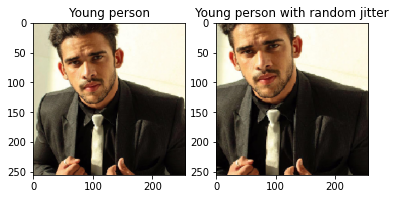

In [ ]:
plt.subplot(121)
plt.title('Young person')
plt.imshow(sample_young[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Young person with random jitter')
plt.imshow(random_jitter(sample_young[0]) * 0.5 + 0.5)

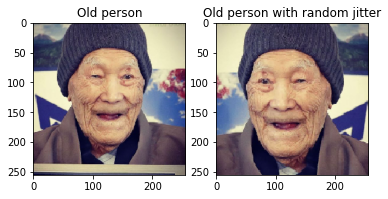

In [ ]:
plt.subplot(121)
plt.title('Old person')
plt.imshow(sample_old[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('Old person with random jitter')
plt.imshow(random_jitter(sample_old[0]) * 0.5 + 0.5)

In [ ]:
# Size of the random crops to be used during training.
input_img_size = (256, 256, 3)

In [ ]:
# Weights initializer for the layers.
kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

# ***Building blocks used in the CycleGAN generators and discriminators***

In [ ]:
class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super(ReflectionPadding2D, self).__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")


def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x

# **Building the generators**

In [ ]:
def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    model = keras.models.Model(img_input, x, name=name)
    return model

# **Building the discriminator**

In [ ]:
def get_discriminator(
    filters=64, kernel_initializer=kernel_init, num_downsampling=3, name=None
):
    img_input = layers.Input(shape=(input_img_size), name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    x = layers.Conv2D(
        1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
    )(x)

    model = keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model


# Get the generators
gen_G = get_resnet_generator(name="generator_G")
gen_F = get_resnet_generator(name="generator_F")

# Get the discriminators
disc_X = get_discriminator(name="discriminator_X")
disc_Y = get_discriminator(name="discriminator_Y")


# **Build the CycleGAN model**

In [ ]:
class CycleGan(keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super(CycleGan, self).__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super(CycleGan, self).compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        # x is Horse and y is zebra
        real_x, real_y = batch_data


        with tf.GradientTape(persistent=True) as tape:
            # young to fake old
            fake_y = self.gen_G(real_x, training=True)
            # old to fake young -> y2x
            fake_x = self.gen_F(real_y, training=True)

            # Cycle (young to fake old to fake young): x -> y -> x
            cycled_x = self.gen_F(fake_y, training=True)
            # Cycle (old to fake young to fake old) y -> x -> y
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adverserial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }

# **Create a callback that periodically saves generated images**

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=2):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(2, 2, figsize=(12, 12))
        for i, img in enumerate(test_young.take(self.num_img)):
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

            prediction = keras.preprocessing.image.array_to_img(prediction)
            prediction.save(
                "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            )
        plt.show()
        plt.close()

In [ ]:
import os
os.mkdir("model_checkpoints")

In [ ]:
def get_model():
  return(CycleGan(generator_G=g, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y))

# **Train the end-to-end model**

Epoch 1/15
266/266 [==============================] - ETA: 0s - G_loss: 5.1861 - F_loss: 5.3028 - D_X_loss: 0.1410 - D_Y_loss: 0.1669

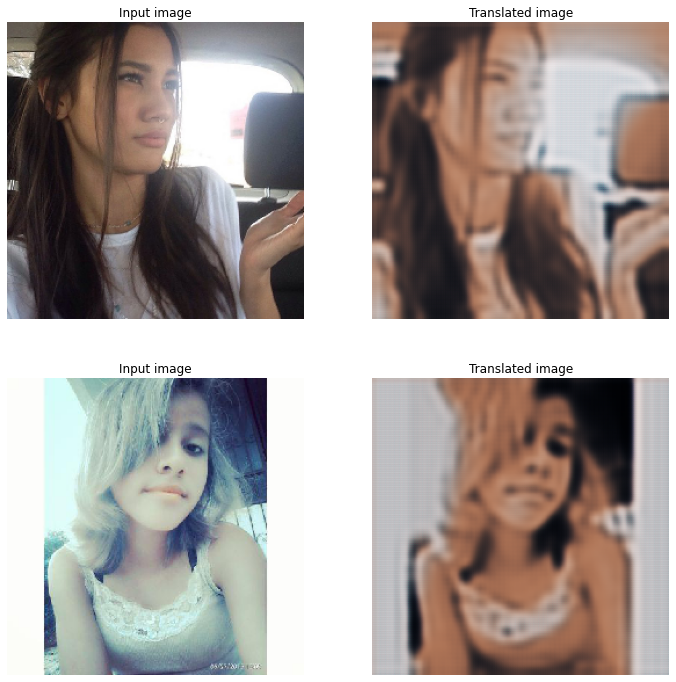

266/266 [==============================] - 661s 2s/step - G_loss: 5.1963 - F_loss: 5.2946 - D_X_loss: 0.1407 - D_Y_loss: 0.1670
Epoch 2/15
266/266 [==============================] - ETA: 0s - G_loss: 4.3782 - F_loss: 4.4354 - D_X_loss: 0.2087 - D_Y_loss: 0.2160

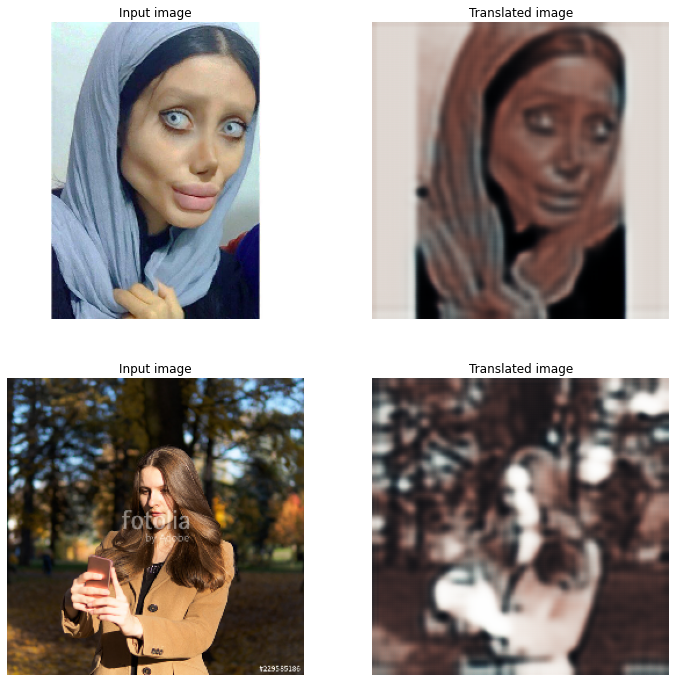

266/266 [==============================] - 584s 2s/step - G_loss: 4.3745 - F_loss: 4.4314 - D_X_loss: 0.2084 - D_Y_loss: 0.2160
Epoch 3/15
266/266 [==============================] - ETA: 0s - G_loss: 4.0081 - F_loss: 3.8419 - D_X_loss: 0.2231 - D_Y_loss: 0.1811

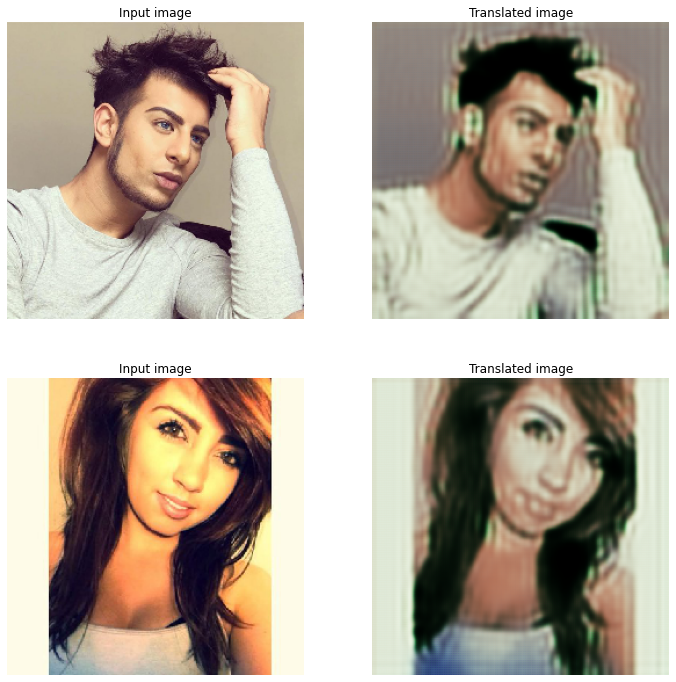

266/266 [==============================] - 581s 2s/step - G_loss: 4.0047 - F_loss: 3.8348 - D_X_loss: 0.2235 - D_Y_loss: 0.1811
Epoch 4/15
266/266 [==============================] - ETA: 0s - G_loss: 3.5604 - F_loss: 3.5616 - D_X_loss: 0.1766 - D_Y_loss: 0.2248

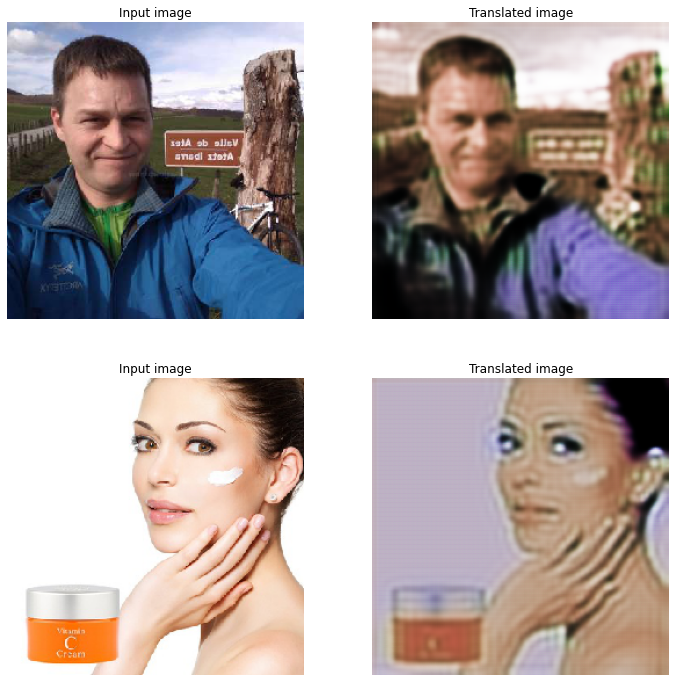

266/266 [==============================] - 581s 2s/step - G_loss: 3.5586 - F_loss: 3.5584 - D_X_loss: 0.1763 - D_Y_loss: 0.2250
Epoch 5/15
266/266 [==============================] - ETA: 0s - G_loss: 3.3435 - F_loss: 3.3943 - D_X_loss: 0.1906 - D_Y_loss: 0.2277

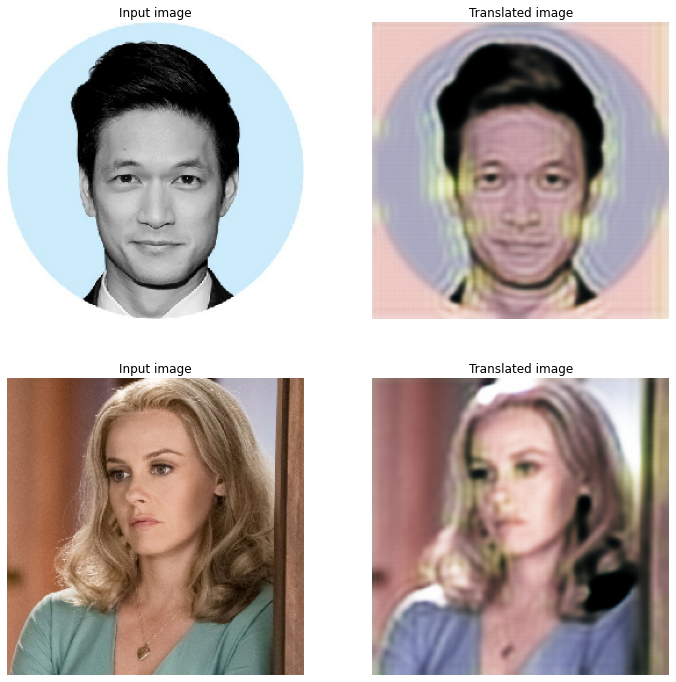

266/266 [==============================] - 583s 2s/step - G_loss: 3.3455 - F_loss: 3.3921 - D_X_loss: 0.1912 - D_Y_loss: 0.2278
Epoch 6/15
266/266 [==============================] - ETA: 0s - G_loss: 3.1964 - F_loss: 3.1503 - D_X_loss: 0.2276 - D_Y_loss: 0.2304

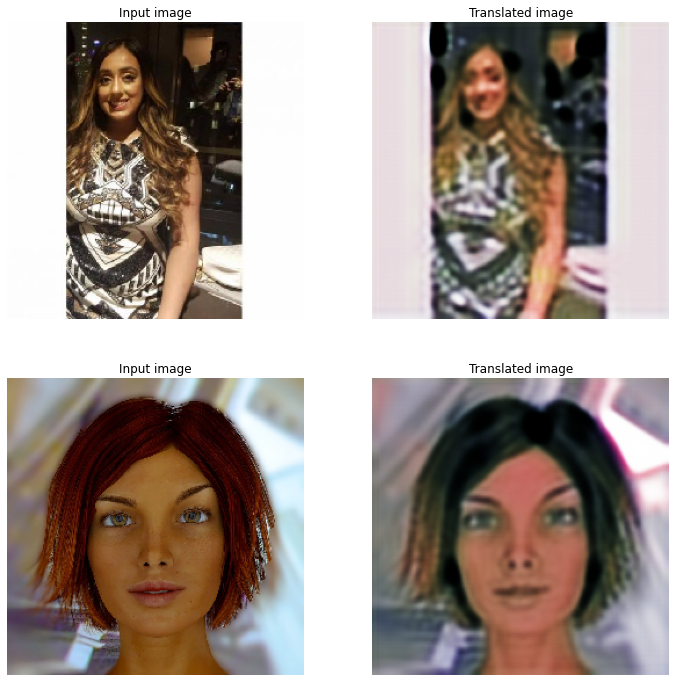

266/266 [==============================] - 583s 2s/step - G_loss: 3.1957 - F_loss: 3.1521 - D_X_loss: 0.2273 - D_Y_loss: 0.2303
Epoch 7/15
266/266 [==============================] - ETA: 0s - G_loss: 3.1731 - F_loss: 3.1080 - D_X_loss: 0.2196 - D_Y_loss: 0.2273

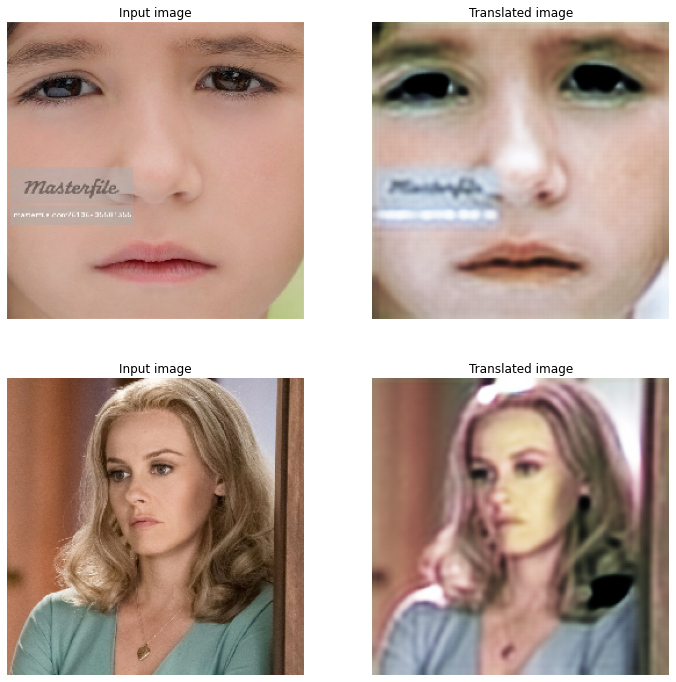

266/266 [==============================] - 583s 2s/step - G_loss: 3.1708 - F_loss: 3.1042 - D_X_loss: 0.2193 - D_Y_loss: 0.2272
Epoch 8/15
266/266 [==============================] - ETA: 0s - G_loss: 3.0359 - F_loss: 2.9926 - D_X_loss: 0.2221 - D_Y_loss: 0.2214

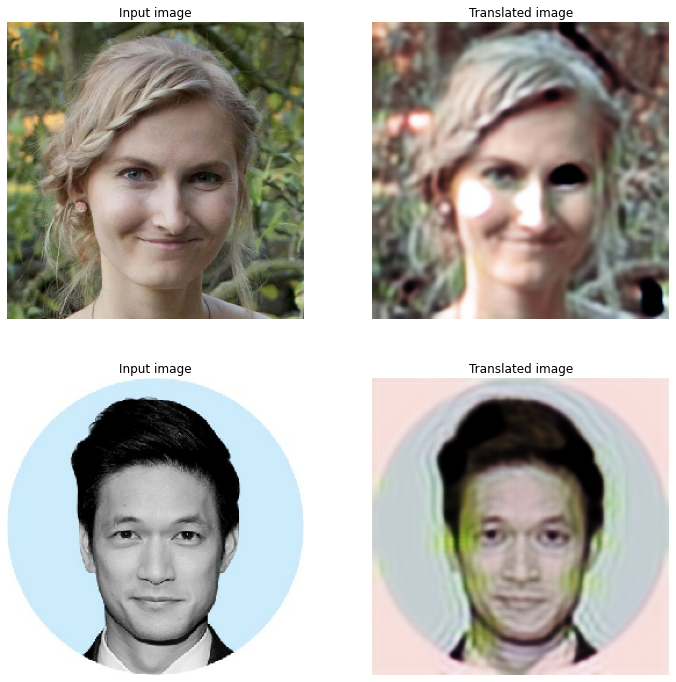

266/266 [==============================] - 583s 2s/step - G_loss: 3.0354 - F_loss: 2.9904 - D_X_loss: 0.2223 - D_Y_loss: 0.2215
Epoch 9/15
266/266 [==============================] - ETA: 0s - G_loss: 2.9950 - F_loss: 2.8990 - D_X_loss: 0.2267 - D_Y_loss: 0.2246

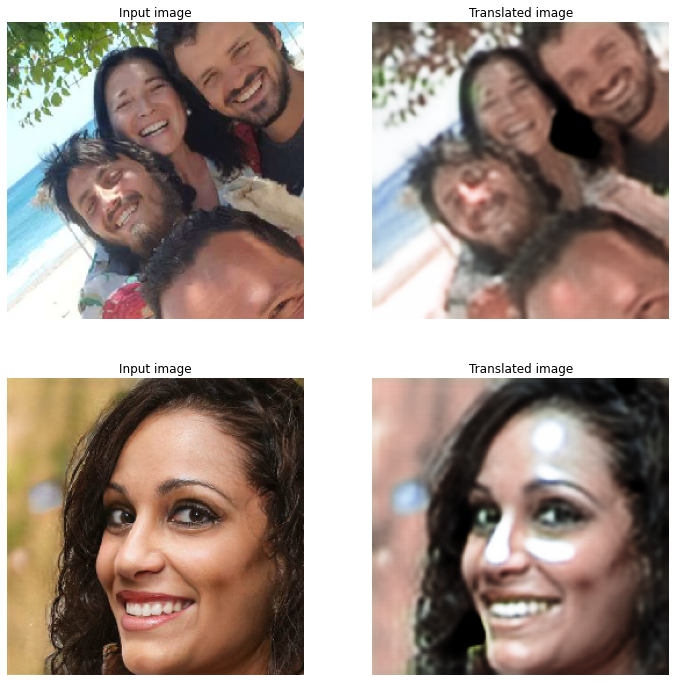

266/266 [==============================] - 583s 2s/step - G_loss: 3.0003 - F_loss: 2.8964 - D_X_loss: 0.2270 - D_Y_loss: 0.2240
Epoch 10/15
266/266 [==============================] - ETA: 0s - G_loss: 2.9485 - F_loss: 2.8117 - D_X_loss: 0.2233 - D_Y_loss: 0.2119

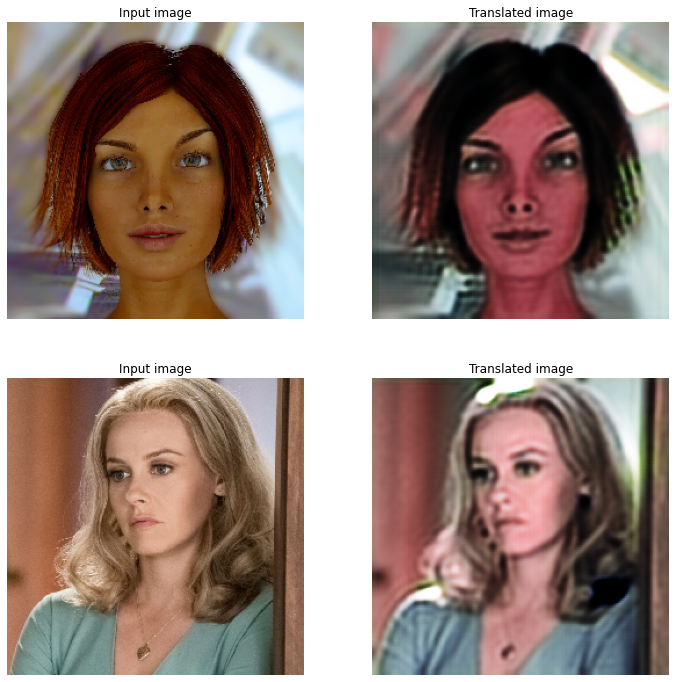

266/266 [==============================] - 583s 2s/step - G_loss: 2.9480 - F_loss: 2.8096 - D_X_loss: 0.2234 - D_Y_loss: 0.2121
Epoch 11/15
266/266 [==============================] - ETA: 0s - G_loss: 2.9902 - F_loss: 2.7994 - D_X_loss: 0.2284 - D_Y_loss: 0.1934

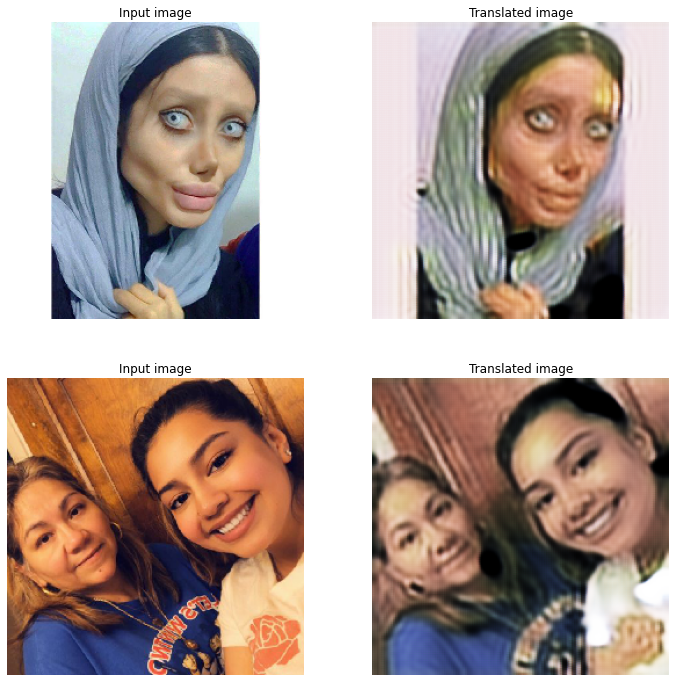

266/266 [==============================] - 583s 2s/step - G_loss: 2.9856 - F_loss: 2.7985 - D_X_loss: 0.2283 - D_Y_loss: 0.1934
Epoch 12/15
266/266 [==============================] - ETA: 0s - G_loss: 2.8786 - F_loss: 2.7614 - D_X_loss: 0.2263 - D_Y_loss: 0.2017

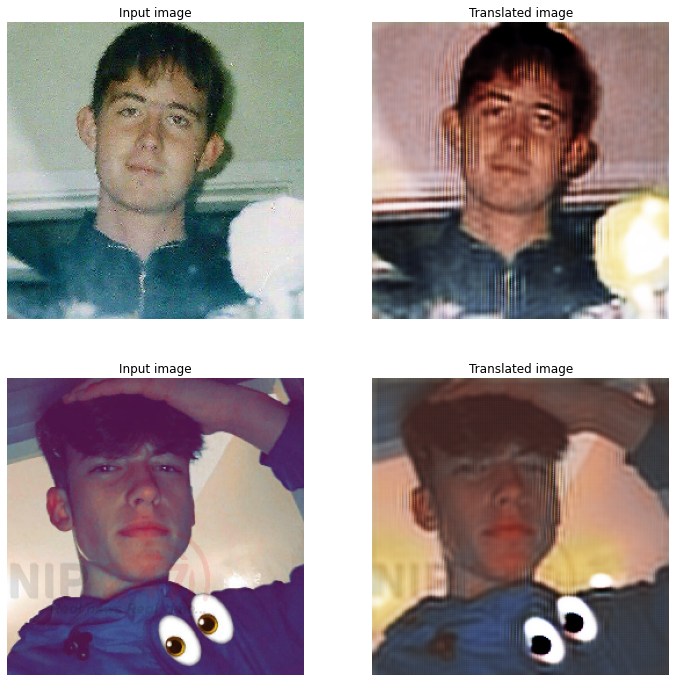

266/266 [==============================] - 583s 2s/step - G_loss: 2.8822 - F_loss: 2.7565 - D_X_loss: 0.2264 - D_Y_loss: 0.2019
Epoch 13/15
266/266 [==============================] - ETA: 0s - G_loss: 2.9305 - F_loss: 2.7017 - D_X_loss: 0.2214 - D_Y_loss: 0.2000

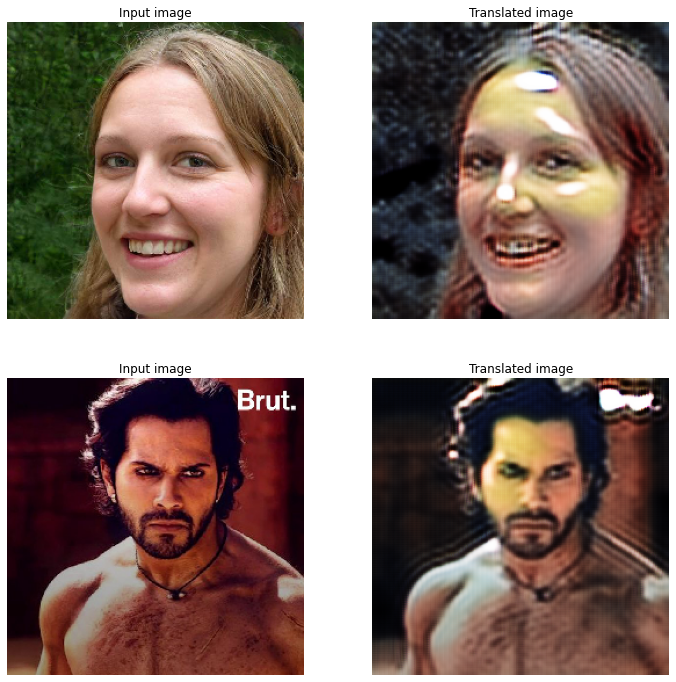

266/266 [==============================] - 583s 2s/step - G_loss: 2.9287 - F_loss: 2.7018 - D_X_loss: 0.2217 - D_Y_loss: 0.2000
Epoch 14/15
266/266 [==============================] - ETA: 0s - G_loss: 2.9133 - F_loss: 2.6623 - D_X_loss: 0.2192 - D_Y_loss: 0.1949

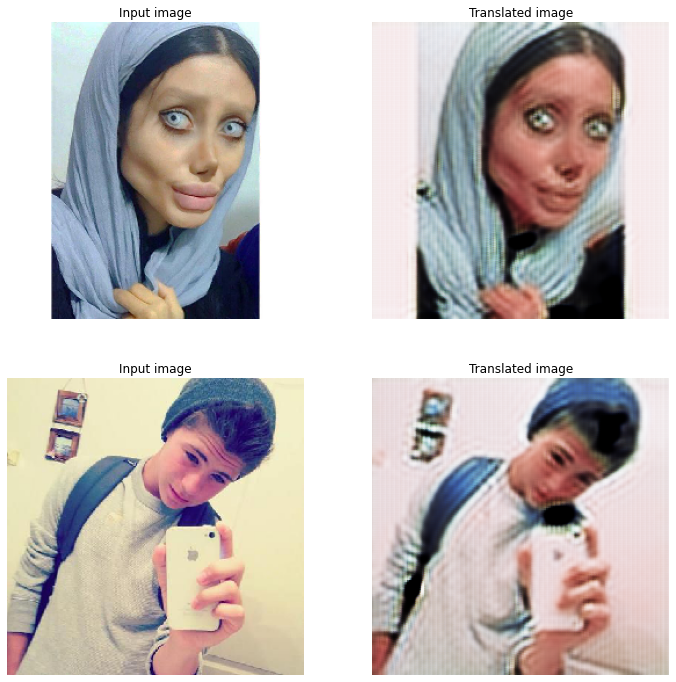

266/266 [==============================] - 582s 2s/step - G_loss: 2.9165 - F_loss: 2.6620 - D_X_loss: 0.2192 - D_Y_loss: 0.1944
Epoch 15/15
266/266 [==============================] - ETA: 0s - G_loss: 2.8794 - F_loss: 2.7134 - D_X_loss: 0.2029 - D_Y_loss: 0.2185

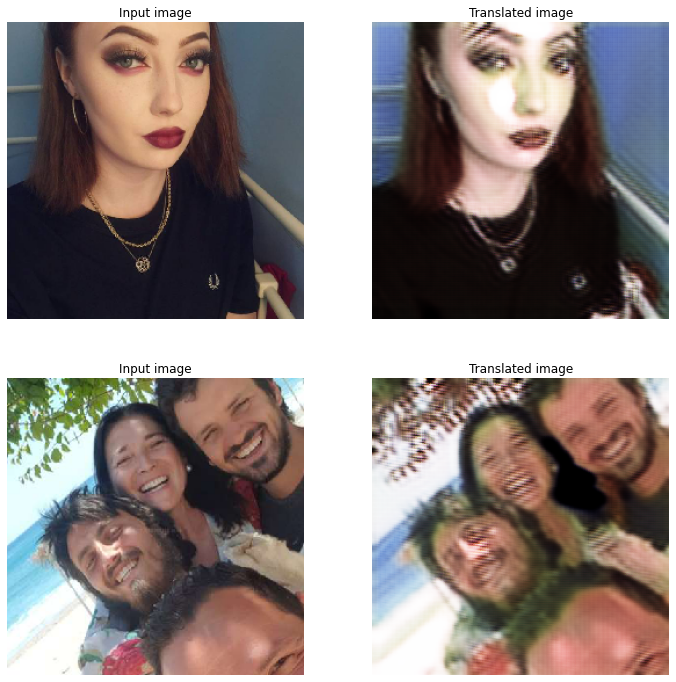

266/266 [==============================] - 580s 2s/step - G_loss: 2.8804 - F_loss: 2.7149 - D_X_loss: 0.2030 - D_Y_loss: 0.2178


In [ ]:
# Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss


# Define the loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = get_model()

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
checkpoint_filepath = "./model_checkpoints/cyclegan_checkpoints.{epoch:03d}"
checkpoint_dir= os.path.dirname(checkpoint_filepath)
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_filepath, save_weights_only=True)

# Here we will train the model for just one epoch as each epoch takes around
# 10 minutes on collab GPU.
cycle_gan_model.fit(
    tf.data.Dataset.zip((train_young, train_old)),
    epochs=15,
    callbacks=[plotter, model_checkpoint_callback]
)

In [ ]:
CycleGan.save_weights('path_to_weights', save_format='tf') 

In [ ]:
!zip model_checkpoint.zip model_checkpoints/*

# **Test the performance of the model.**

In [ ]:
os.mkdir("Predicted_images")

Weights loaded successfully


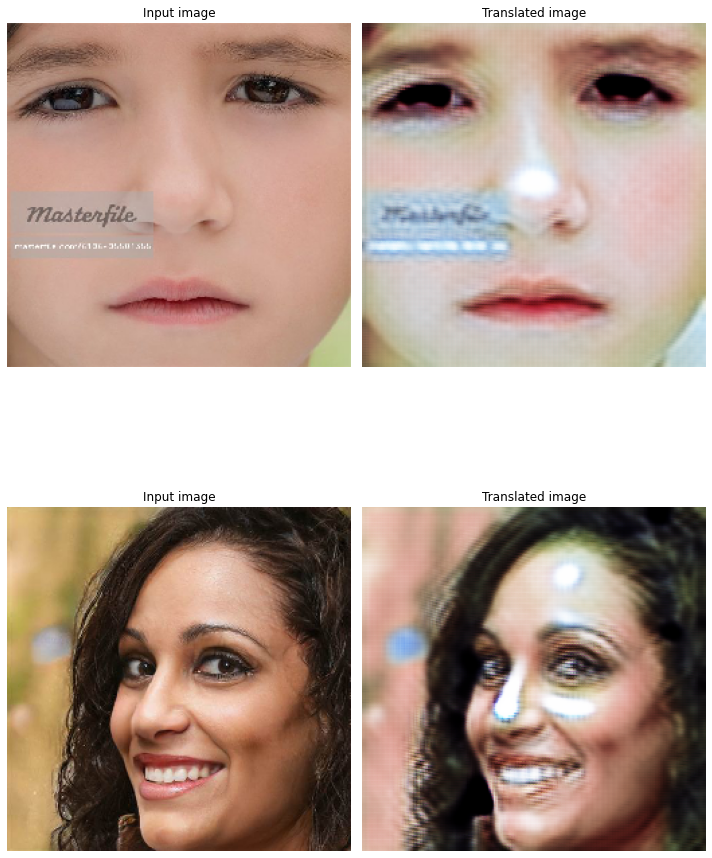

In [ ]:
# Load the checkpoints
latest=tf.train.latest_checkpoint(checkpoint_dir)
cycle_gan_model.load_weights(latest).expect_partial()
print("Weights loaded successfully")

_, ax = plt.subplots(2, 2, figsize=(10, 15))
for i, img in enumerate(test_young.take(2)):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.preprocessing.image.array_to_img(prediction)
    prediction.save("./Predicted_images/predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()


In [ ]:
!zip Predicted_images.zip Predicted_images/*png